In [52]:
# Packages
import heapq
import random
import numpy as np
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output
import matplotlib.animation as animation
from IPython.display import HTML

# Other scripts
from store import *
from visualisation import *
from ga import *
from config import *
from analysis import *
from path import *

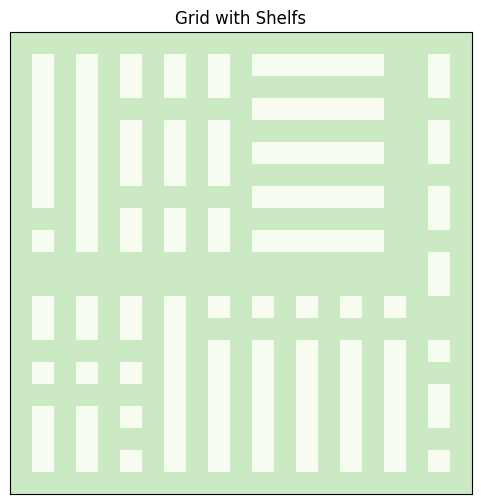

In [53]:
# Creating the store layout with shelfes
create_store_layout(grid)

# visualizing the store with shelfes
visualize_store(grid)

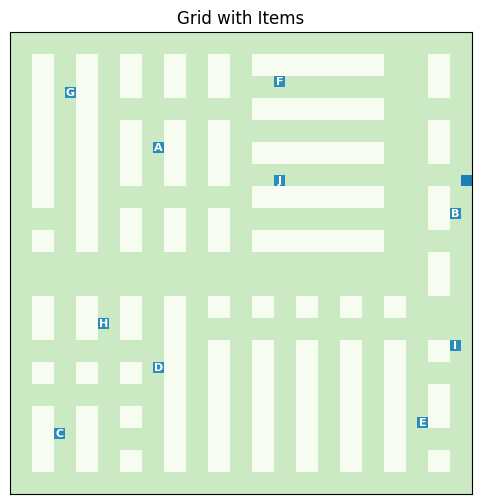

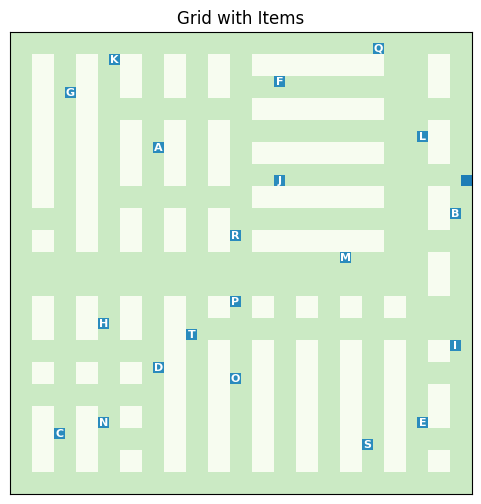

In [54]:
# Visualizing the items placement in the store (first 10)
visualize_items(grid, start, items_10)

# Visualizing the items placement in the store (all 20)
visualize_items(grid, start, items)

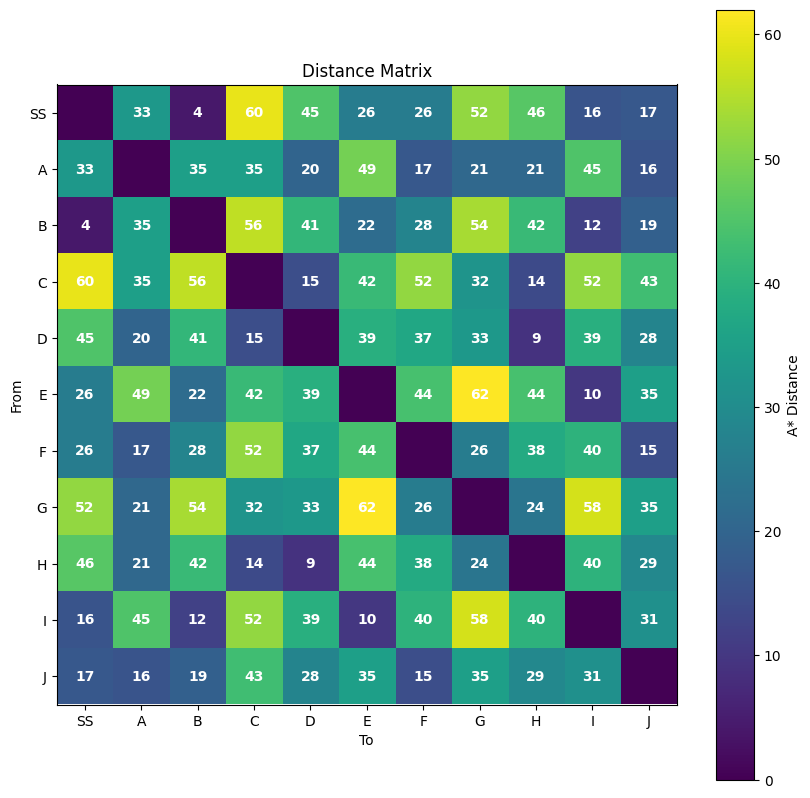

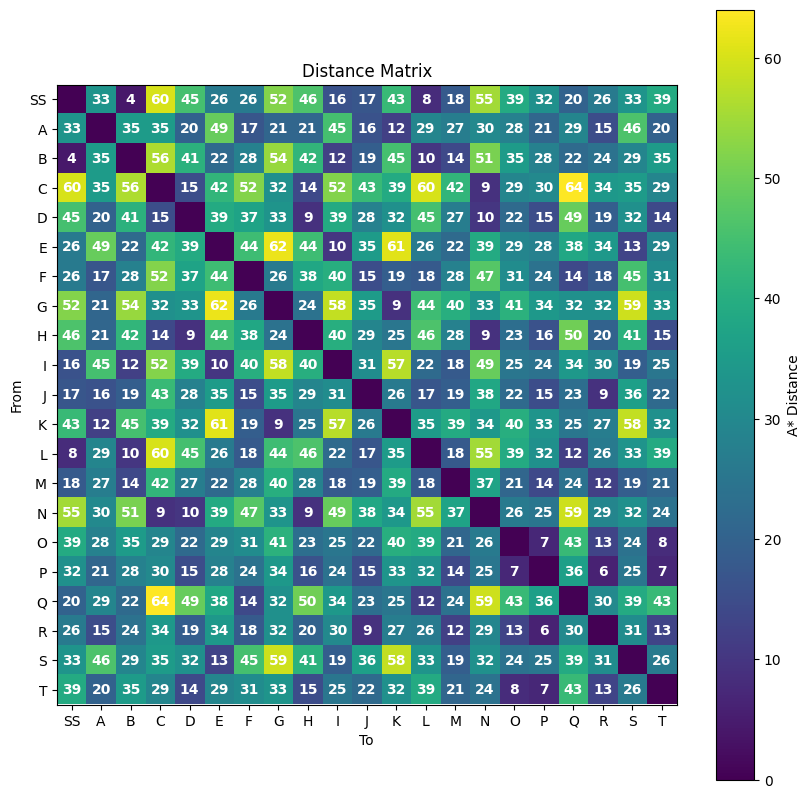

In [55]:
# Creates a distance matrix of the items with A* (first 10)
distance_matrix_10 = build_distance_matrix(grid, start, items_10)

# Creates a distance matrix of the items with A* (all 20)
distance_matrix_all = build_distance_matrix(grid, start, items)

# Visualizes the distance matrix of the items (first 10)
visualize_distance_matrix(distance_matrix_10, len(items_10) + 1)

# Visualizes the distance matrix of the items (all 20)
visualize_distance_matrix(distance_matrix_all, len(items) + 1)

In [56]:
distance_matrix = build_distance_matrix(
    grid,
    start,
    items_10
)

best, history_best, distance_history_best, fit_best_history_best, fit_avg_history_best, fit_worst_history_best = genetic_algorithm_with_history(
    distance_matrix=distance_matrix,
    items=items_10,
    generations=200,
    size=50,
    mutation=0.02
)

best_route = history_best[-1]

print("Best route:", best_route)
print("Distance:", route_distance(best_route,distance_matrix))

Gen 0: 228
Gen 10: 204
Gen 20: 204
Gen 30: 204
Gen 40: 204
Gen 50: 204
Gen 60: 204
Gen 70: 204
Gen 80: 204
Gen 90: 204
Gen 100: 204
Gen 110: 204
Gen 120: 202
Gen 130: 202
Gen 140: 202
Gen 150: 202
Gen 160: 202
Gen 170: 202
Gen 180: 202
Gen 190: 202
Best route: [1, 8, 4, 5, 6, 7, 2, 3, 0, 9]
Distance: 202


In [57]:
distance_matrix = build_distance_matrix(
    grid,
    start,
    items
)

best_opt, history_opt, distance_history_opt, fit_best_history_opt, fit_avg_history_opt, fit_worst_history_opt = genetic_algorithm_with_history(
    distance_matrix=distance_matrix,
    items=items_10,
    generations=50,
    size=100,
    mutation=0.05
)

best_route_optimized = history_opt[-1]

print("Best optimized route:", best_route_optimized)
print("Distance:", route_distance(best_route_optimized,distance_matrix))

Gen 0: 226
Gen 10: 190
Gen 20: 190
Gen 30: 190
Gen 40: 190
Best optimized route: [1, 8, 4, 3, 7, 2, 6, 0, 5, 9]
Distance: 190


In [58]:
active_items = items_10

random_route = random.sample(
    range(len(active_items)),
    len(active_items)
)

random_distance = route_distance(
    random_route,
    distance_matrix
)

best_distance = route_distance(
    best_route,
    distance_matrix
)

optimized_distance = route_distance(
    best_route_optimized,
    distance_matrix
)

print("Random Route Distance:", random_distance)
print("GA Route Distance - Best:", best_distance)
print("GA Route Distance - Optimized:", optimized_distance)

route_improvement_best = (
    (random_distance - best_distance)
    / random_distance
) * 100

route_improvement_opt = (
    (random_distance - optimized_distance)
    / random_distance
) * 100

print(
    f"Improvement from Best: "
    f"{route_improvement_best:.2f}%"
)

print(
    f"Improvement from Optimized: "
    f"{route_improvement_opt:.2f}%"
)

Random Route Distance: 326
GA Route Distance - Best: 202
GA Route Distance - Optimized: 190
Improvement from Best: 38.04%
Improvement from Optimized: 41.72%


In [59]:
distance_matrix = build_distance_matrix(
    grid,
    start,
    items_10
)

results, convergence_data = benchmark_selection_methods(
    methods,
    distance_matrix=distance_matrix,
    items=items_10,
    generations=100,
    size=100,
    runs=5,
    mutation=0.2
)


===== Testing RANDOM =====
Gen 0: 258
Gen 10: 230
Gen 20: 220
Gen 30: 220
Gen 40: 220
Gen 50: 220
Gen 60: 220
Gen 70: 212
Gen 80: 212
Gen 90: 212
Run 1: Distance = 212.0, Time = 0.07s
Gen 0: 238
Gen 10: 230
Gen 20: 230
Gen 30: 222
Gen 40: 218
Gen 50: 218
Gen 60: 208
Gen 70: 208
Gen 80: 208
Gen 90: 208
Run 2: Distance = 208.0, Time = 0.08s
Gen 0: 254
Gen 10: 242
Gen 20: 240
Gen 30: 240
Gen 40: 234
Gen 50: 208
Gen 60: 208
Gen 70: 208
Gen 80: 208
Gen 90: 208
Run 3: Distance = 208.0, Time = 0.07s
Gen 0: 258
Gen 10: 220
Gen 20: 220
Gen 30: 220
Gen 40: 220
Gen 50: 220
Gen 60: 220
Gen 70: 220
Gen 80: 220
Gen 90: 220
Run 4: Distance = 220.0, Time = 0.07s
Gen 0: 244
Gen 10: 228
Gen 20: 228
Gen 30: 186
Gen 40: 186
Gen 50: 186
Gen 60: 186
Gen 70: 186
Gen 80: 186
Gen 90: 186
Run 5: Distance = 186.0, Time = 0.07s

===== Testing TOURNAMENT =====
Gen 0: 214
Gen 10: 208
Gen 20: 192
Gen 30: 192
Gen 40: 192
Gen 50: 192
Gen 60: 192
Gen 70: 192
Gen 80: 192
Gen 90: 192
Run 1: Distance = 192.0, Time = 0.18

In [80]:
print("Random Avg Distance:", results["random"]["Average Distance"])
print("Tournament Avg Distance:", results["tournament"]["Average Distance"])
print("Roulette Avg Distance:", results["roulette"]["Average Distance"])
print("Rank Avg Distance:", results["rank"]["Average Distance"])
print("SUS Avg Distance:", results["sus"]["Average Distance"])

Random Avg Distance: 206.8
Tournament Avg Distance: 190.4
Roulette Avg Distance: 204.4
Rank Avg Distance: 241.6
SUS Avg Distance: 203.2


In [82]:
print("Random Avg Runtime:", results["random"]["Average Runtime (s)"])
print("Tournament Avg Runtime:", results["tournament"]["Average Runtime (s)"])
print("Roulette Avg Runtime:", results["roulette"]["Average Runtime (s)"])
print("Rank Avg Runtime:", results["rank"]["Average Runtime (s)"])
print("Sus Avg Runtime:", results["sus"]["Average Runtime (s)"])

Random Avg Runtime: 0.07365469932556153
Tournament Avg Runtime: 0.18571906089782714
Roulette Avg Runtime: 2.7786408424377442
Rank Avg Runtime: 3.013299894332886
Sus Avg Runtime: 2.862472343444824


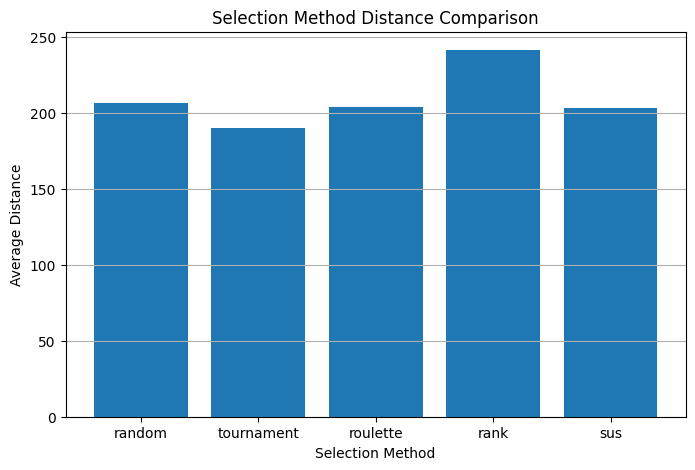

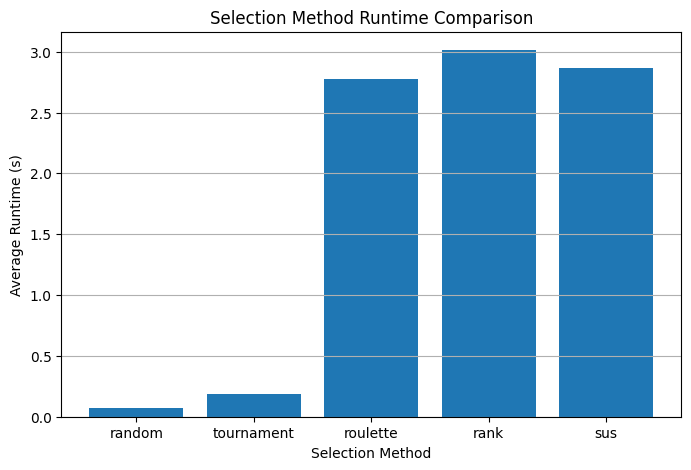

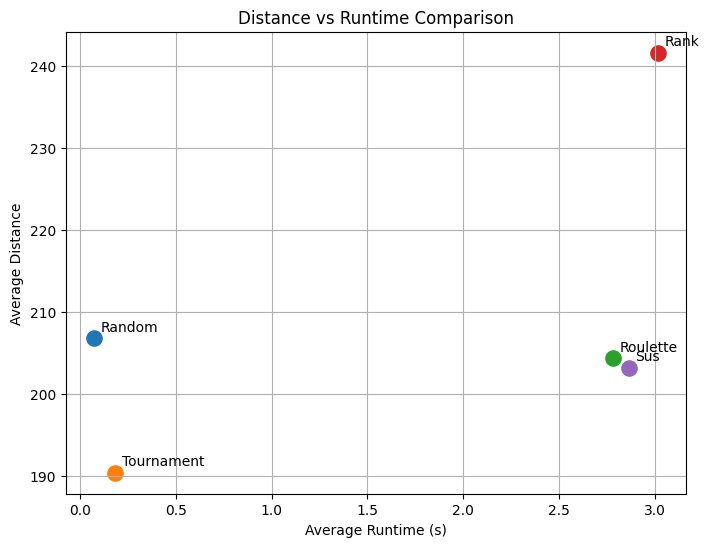

In [60]:
plot_selection_comparison(results)

plot_selection_runtime(results)

plot_distance_runtime_tradeoff(results)

In [61]:
distance_matrix = build_distance_matrix(
    grid,
    start,
    items_10
)

hyper_results = hyperparameter_analysis(
    distance_matrix=distance_matrix,
    items=items_10,
    selection_type="tournament"
)


===== POPULATION SIZE ANALYSIS =====
Gen 0: 260
Gen 10: 206
Gen 20: 192
Gen 30: 192
Gen 40: 192
Gen 50: 186
Gen 60: 186
Gen 70: 186
Gen 80: 186
Gen 90: 186
Population 50: Distance=186, Time=0.11s
Gen 0: 252
Gen 10: 188
Gen 20: 186
Gen 30: 186
Gen 40: 186
Gen 50: 186
Gen 60: 186
Gen 70: 186
Gen 80: 186
Gen 90: 186
Population 100: Distance=186, Time=0.20s
Gen 0: 248
Gen 10: 206
Gen 20: 194
Gen 30: 194
Gen 40: 194
Gen 50: 194
Gen 60: 194
Gen 70: 194
Gen 80: 194
Gen 90: 194
Population 200: Distance=194, Time=0.41s
Gen 0: 216
Gen 10: 186
Gen 20: 186
Gen 30: 186
Gen 40: 186
Gen 50: 186
Gen 60: 186
Gen 70: 186
Gen 80: 186
Gen 90: 186
Population 500: Distance=186, Time=0.98s
Gen 0: 216
Gen 10: 186
Gen 20: 186
Gen 30: 186
Gen 40: 186
Gen 50: 186
Gen 60: 186
Gen 70: 186
Gen 80: 186
Gen 90: 186
Population 1000: Distance=186, Time=2.06s

===== MUTATION RATE ANALYSIS =====
Gen 0: 264
Gen 10: 194
Gen 20: 190
Gen 30: 190
Gen 40: 190
Gen 50: 190
Gen 60: 190
Gen 70: 190
Gen 80: 190
Gen 90: 190
Mutatio

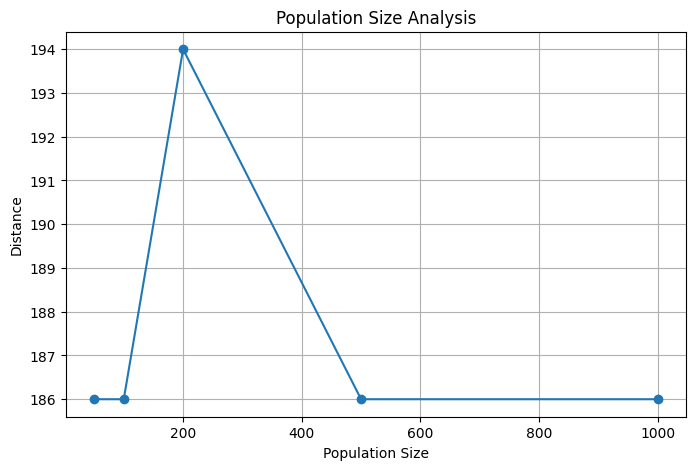

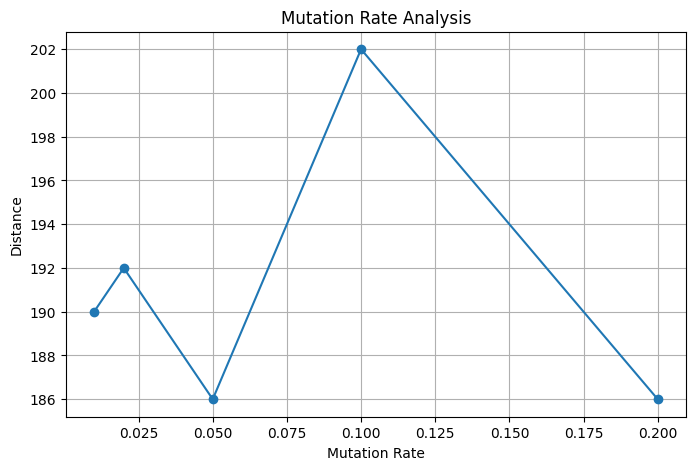

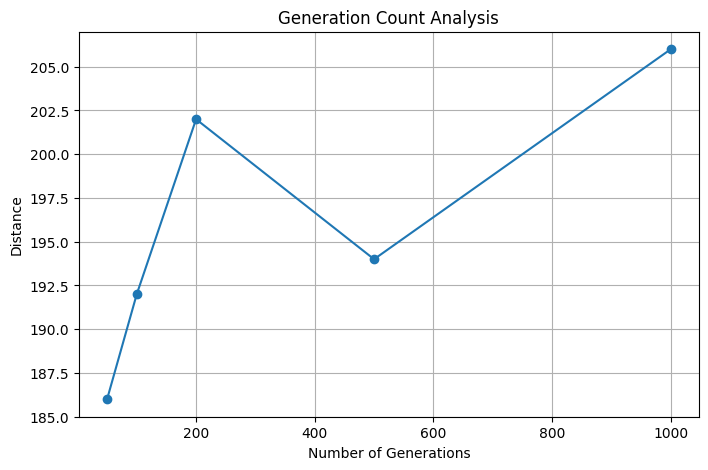

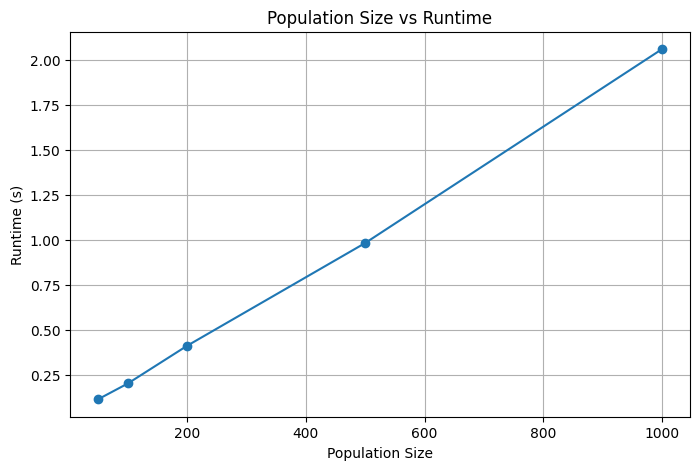

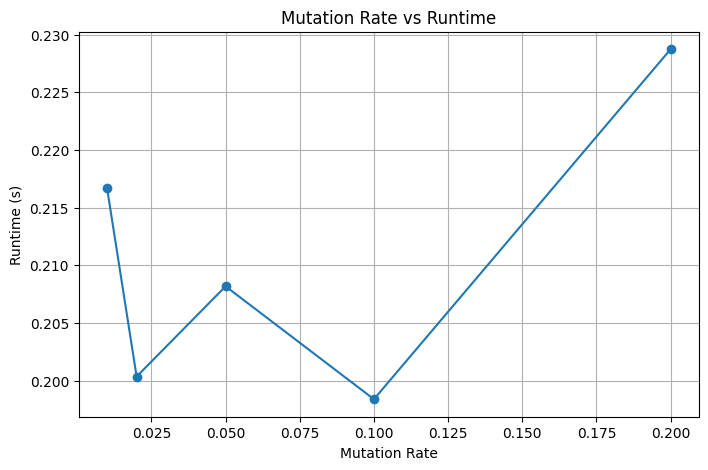

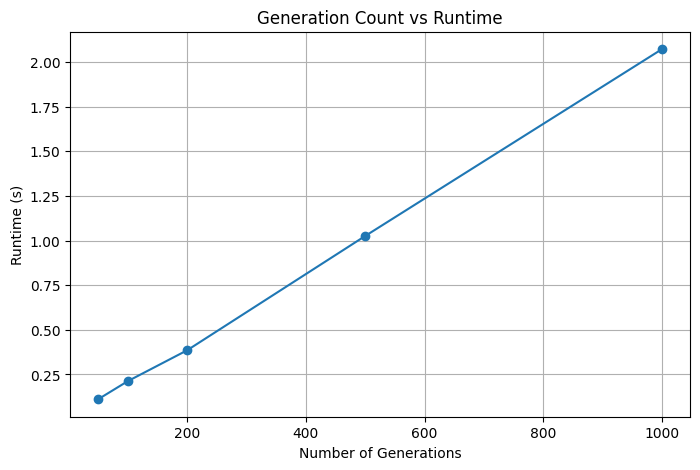

In [62]:
plot_population_size_analysis(hyper_results)

plot_mutation_rate_analysis(hyper_results)

plot_generation_analysis(hyper_results)

plot_population_runtime(hyper_results)

plot_mutation_runtime(hyper_results)

plot_generation_runtime(hyper_results)

In [63]:
grid_results = parameter_grid_search(
    distance_matrix=distance_matrix,
    items=items_10,
    selection_type="tournament"
)

best_result, optimized_result = find_best_hyperparameters(
    grid_results
)

print(best_result)
print(optimized_result)

Gen 0: 260
Gen 10: 212
Gen 20: 208
Gen 30: 208
Gen 40: 208
Pop=50, Mut=0.01, Gen=50 -> Distance=208.0, Time=0.07s
Gen 0: 254
Gen 10: 202
Gen 20: 202
Gen 30: 202
Gen 40: 202
Gen 50: 202
Gen 60: 202
Gen 70: 202
Gen 80: 202
Gen 90: 202
Pop=50, Mut=0.01, Gen=100 -> Distance=202.0, Time=0.10s
Gen 0: 260
Gen 10: 194
Gen 20: 194
Gen 30: 194
Gen 40: 192
Gen 50: 192
Gen 60: 192
Gen 70: 192
Gen 80: 192
Gen 90: 192
Gen 100: 192
Gen 110: 192
Gen 120: 192
Gen 130: 192
Gen 140: 192
Gen 150: 192
Gen 160: 192
Gen 170: 192
Gen 180: 192
Gen 190: 192
Pop=50, Mut=0.01, Gen=200 -> Distance=192.0, Time=0.19s
Gen 0: 230
Gen 10: 190
Gen 20: 190
Gen 30: 190
Gen 40: 190
Pop=50, Mut=0.02, Gen=50 -> Distance=190.0, Time=0.06s
Gen 0: 260
Gen 10: 186
Gen 20: 186
Gen 30: 186
Gen 40: 186
Gen 50: 186
Gen 60: 186
Gen 70: 186
Gen 80: 186
Gen 90: 186
Pop=50, Mut=0.02, Gen=100 -> Distance=186.0, Time=0.11s
Gen 0: 256
Gen 10: 192
Gen 20: 192
Gen 30: 192
Gen 40: 192
Gen 50: 192
Gen 60: 192
Gen 70: 192
Gen 80: 192
Gen 90: 19

In [64]:
top_results = print_top_hyperparameter_combinations(
    grid_results,
    top_n=10
)


===== TOP 10 COMBINATIONS =====
 1. Pop=50, Mut=0.02, Gen=100 -> Distance=186.0, Runtime=0.11s
 2. Pop=50, Mut=0.05, Gen=200 -> Distance=186.0, Runtime=0.20s
 3. Pop=100, Mut=0.01, Gen=50 -> Distance=186.0, Runtime=0.10s
 4. Pop=100, Mut=0.05, Gen=50 -> Distance=186.0, Runtime=0.11s
 5. Pop=100, Mut=0.05, Gen=200 -> Distance=186.0, Runtime=0.39s
 6. Pop=200, Mut=0.01, Gen=100 -> Distance=186.0, Runtime=0.41s
 7. Pop=200, Mut=0.01, Gen=200 -> Distance=186.0, Runtime=0.80s
 8. Pop=200, Mut=0.02, Gen=50 -> Distance=186.0, Runtime=0.22s
 9. Pop=200, Mut=0.02, Gen=100 -> Distance=186.0, Runtime=0.41s
10. Pop=200, Mut=0.05, Gen=50 -> Distance=186.0, Runtime=0.19s


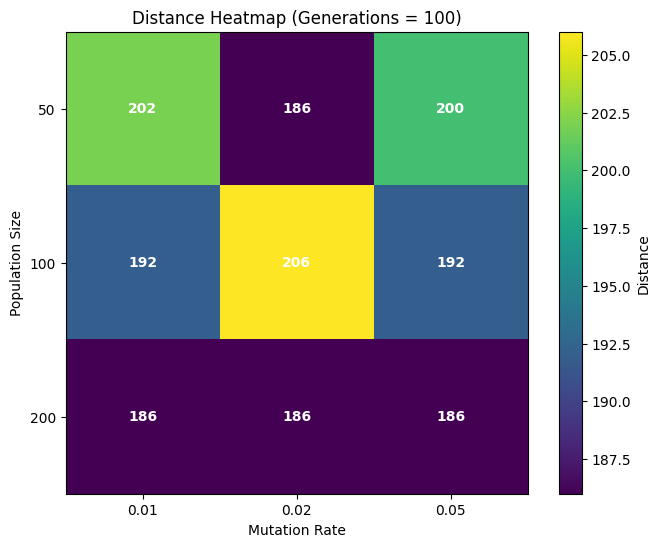

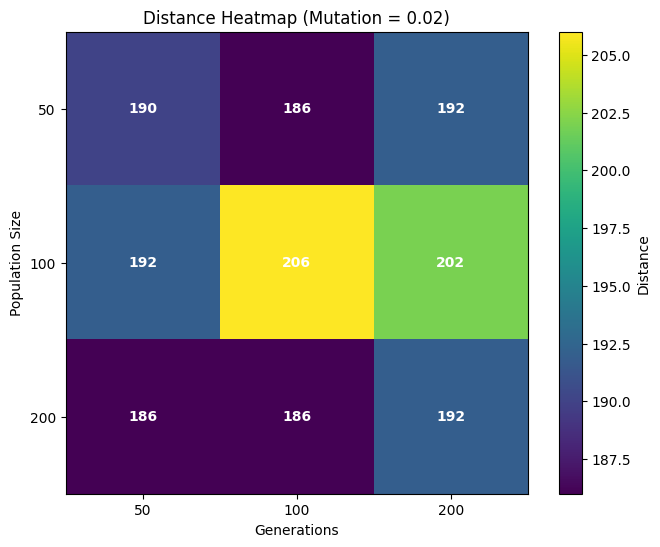

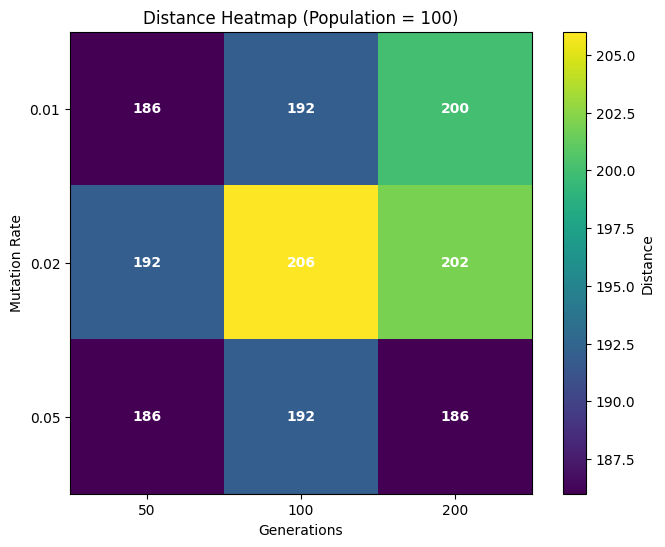

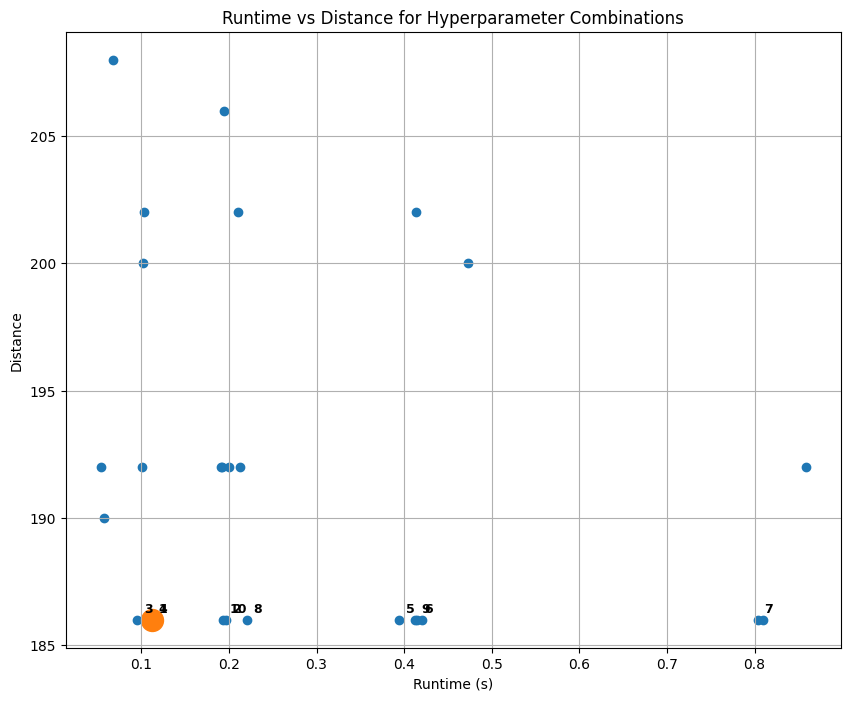


===== TOP 10 CONFIGURATIONS =====
 1. Pop=50, Mut=0.02, Gen=100 -> Distance=186.0, Runtime=0.11s
 2. Pop=50, Mut=0.05, Gen=200 -> Distance=186.0, Runtime=0.20s
 3. Pop=100, Mut=0.01, Gen=50 -> Distance=186.0, Runtime=0.10s
 4. Pop=100, Mut=0.05, Gen=50 -> Distance=186.0, Runtime=0.11s
 5. Pop=100, Mut=0.05, Gen=200 -> Distance=186.0, Runtime=0.39s
 6. Pop=200, Mut=0.01, Gen=100 -> Distance=186.0, Runtime=0.41s
 7. Pop=200, Mut=0.01, Gen=200 -> Distance=186.0, Runtime=0.80s
 8. Pop=200, Mut=0.02, Gen=50 -> Distance=186.0, Runtime=0.22s
 9. Pop=200, Mut=0.02, Gen=100 -> Distance=186.0, Runtime=0.41s
10. Pop=200, Mut=0.05, Gen=50 -> Distance=186.0, Runtime=0.19s


[{'Population': 50,
  'Mutation': 0.02,
  'Generations': 100,
  'Distance': 186,
  'Runtime': 0.11218643188476562},
 {'Population': 50,
  'Mutation': 0.05,
  'Generations': 200,
  'Distance': 186,
  'Runtime': 0.19688916206359863},
 {'Population': 100,
  'Mutation': 0.01,
  'Generations': 50,
  'Distance': 186,
  'Runtime': 0.09549713134765625},
 {'Population': 100,
  'Mutation': 0.05,
  'Generations': 50,
  'Distance': 186,
  'Runtime': 0.11179924011230469},
 {'Population': 100,
  'Mutation': 0.05,
  'Generations': 200,
  'Distance': 186,
  'Runtime': 0.39470696449279785},
 {'Population': 200,
  'Mutation': 0.01,
  'Generations': 100,
  'Distance': 186,
  'Runtime': 0.4146559238433838},
 {'Population': 200,
  'Mutation': 0.01,
  'Generations': 200,
  'Distance': 186,
  'Runtime': 0.8035469055175781},
 {'Population': 200,
  'Mutation': 0.02,
  'Generations': 50,
  'Distance': 186,
  'Runtime': 0.22008919715881348},
 {'Population': 200,
  'Mutation': 0.02,
  'Generations': 100,
  'Dista

In [65]:
plot_population_mutation_heatmap(
    grid_results,
    generations=100
)

plot_population_generation_heatmap(
    grid_results,
    mutation=0.02
)

plot_mutation_generation_heatmap(
    grid_results,
    population=100
)

plot_runtime_distance_scatter(
    grid_results,
    top_n=10
)

In [66]:
full_path = build_full_path(
    best_route,
    grid,
    start,
    items_10
)

optimized_full_path = build_full_path(
    best_route_optimized,
    grid,
    start,
    items_10
)

random_full_path = build_full_path(
    random_route,
    grid,
    start,
    items_10
)

c:\Users\clama\Documents\GitHub\AIProgrammingMiniProject\visualisation.py:702: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


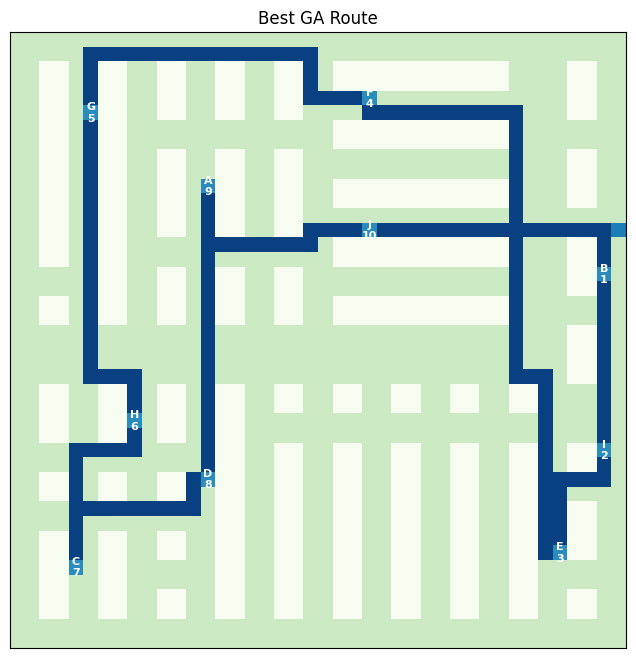

In [67]:
visualize_path(
    grid,
    full_path,
    start,
    items_10,
    best_route,
    title="Best GA Route"
)

c:\Users\clama\Documents\GitHub\AIProgrammingMiniProject\visualisation.py:702: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


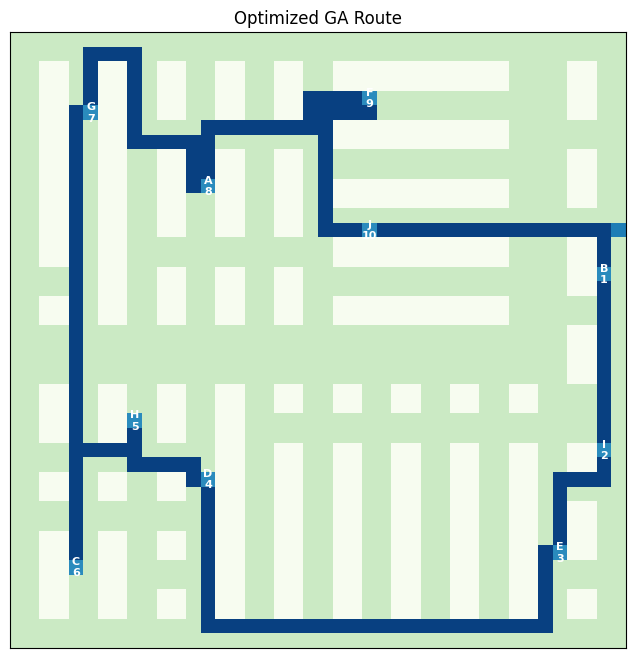

In [83]:
visualize_path(
    grid,
    optimized_full_path,
    start,
    items_10,
    best_route_optimized,
    title="Optimized GA Route"
)

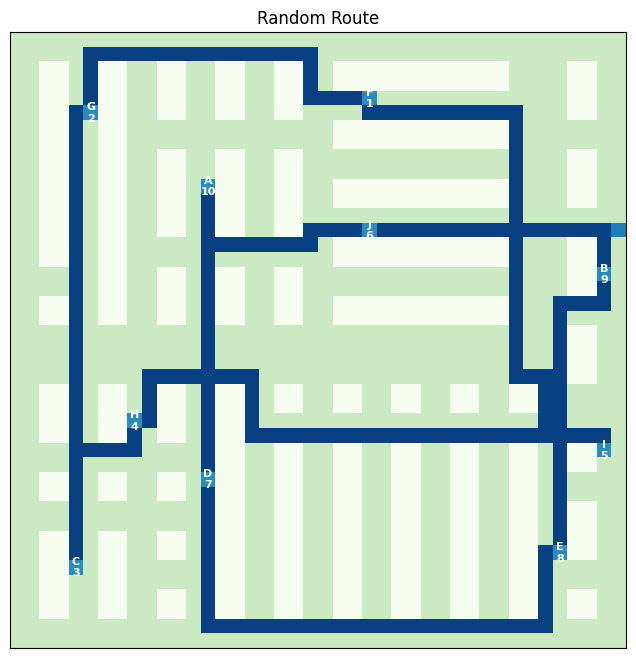

In [69]:
visualize_path(
    grid,
    random_full_path,
    start,
    items_10,
    random_route,
    title="Random Route"
)

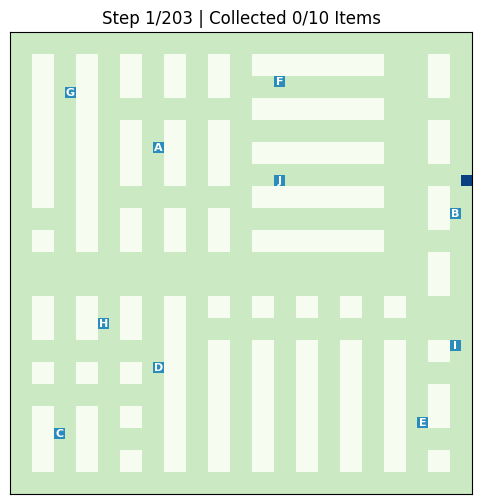

In [70]:
ani = animate_heatmap_funcanimation(
    grid,
    full_path,
    start,
    items_10,
    trail_length=10,
    interval=50
)

HTML(ani.to_jshtml())

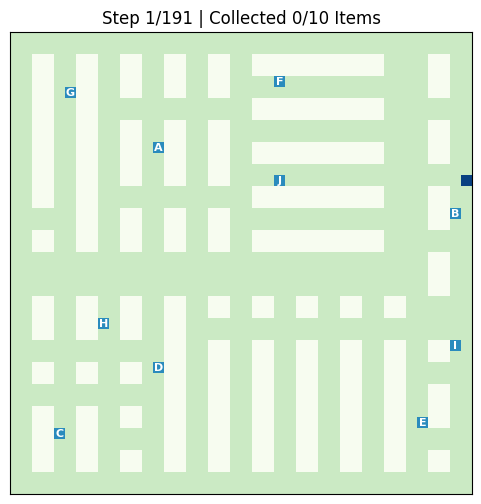

In [84]:
ani = animate_heatmap_funcanimation(
    grid,
    optimized_full_path,
    start,
    items_10,
    trail_length=10,
    interval=50
)

HTML(ani.to_jshtml())

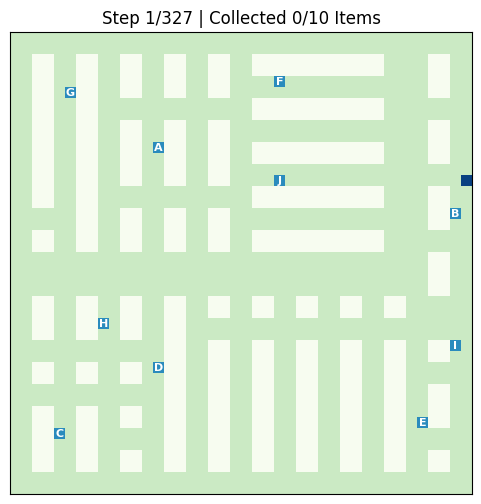

In [88]:
ani = animate_heatmap_funcanimation(
    grid,
    random_full_path,
    start,
    items_10,
    trail_length=10,
    interval=50
)

HTML(ani.to_jshtml())

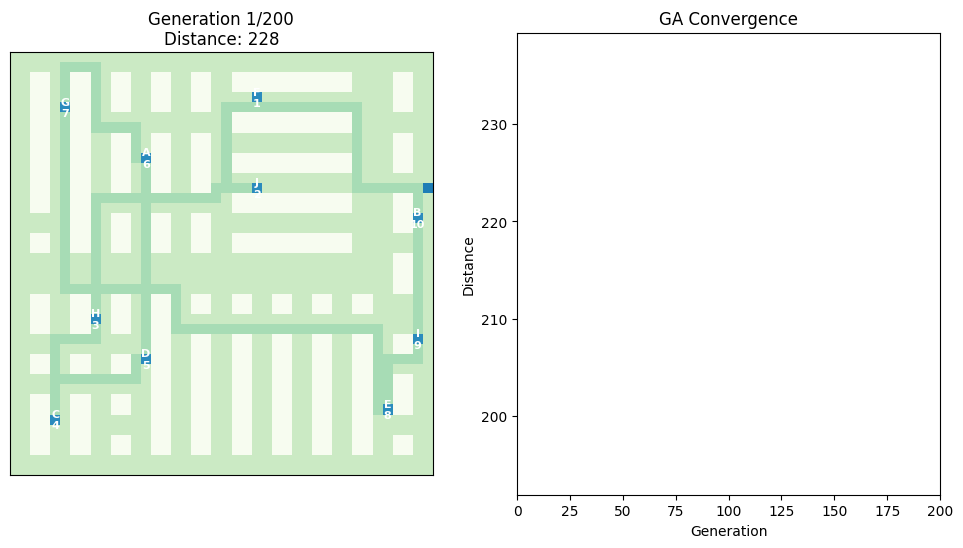

In [87]:
ani = animate_ga_evolution(
    grid,
    history_best,
    distance_history_best,
    start,
    items_10,
    distance_matrix,
    interval=150,
    generation_step=5
)

HTML(ani.to_jshtml())

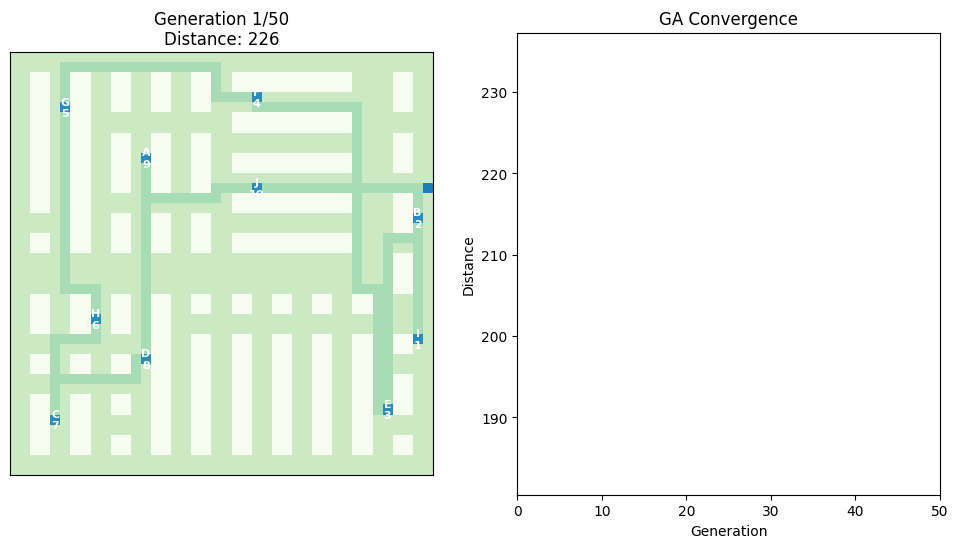

In [85]:
ani = animate_ga_evolution(
    grid,
    history_opt,
    distance_history_opt,
    start,
    items_10,
    distance_matrix,
    interval=150,
    generation_step=5
)

HTML(ani.to_jshtml())

In [75]:
scale_results = scalability_analysis(
    grid,
    start,
    item_sets,
    generations=100,
    size=100,
    mutation=0.02,
    selection_type="tournament"
)

Gen 0: 134
Gen 10: 134
Gen 20: 134
Gen 30: 134
Gen 40: 134
Gen 50: 134
Gen 60: 134
Gen 70: 134
Gen 80: 134
Gen 90: 134
5 Items: Distance=134.0, Time=0.14s
Gen 0: 200
Gen 10: 180
Gen 20: 180
Gen 30: 180
Gen 40: 180
Gen 50: 180
Gen 60: 180
Gen 70: 180
Gen 80: 180
Gen 90: 180
10 Items: Distance=180.0, Time=0.20s
Gen 0: 370
Gen 10: 294
Gen 20: 280
Gen 30: 268
Gen 40: 268
Gen 50: 268
Gen 60: 266
Gen 70: 254
Gen 80: 254
Gen 90: 254
15 Items: Distance=254.0, Time=0.26s
Gen 0: 444
Gen 10: 360
Gen 20: 320
Gen 30: 306
Gen 40: 306
Gen 50: 306
Gen 60: 306
Gen 70: 306
Gen 80: 306
Gen 90: 306
20 Items: Distance=294.0, Time=0.33s


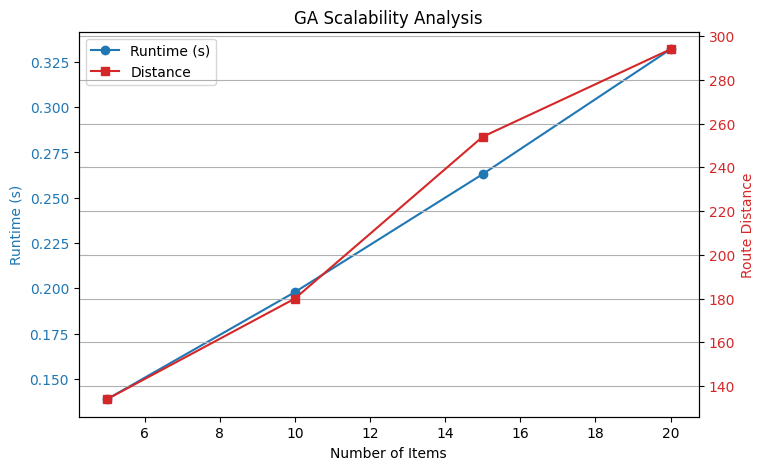

In [76]:
plot_scalability_summary(scale_results)